In [1]:
# https://www.kaggle.com/datasets/muratkokludataset/date-fruit-datasets

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import colors
from collections import OrderedDict
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
%matplotlib inline

sns.set(rc={"axes.facecolor":"#F2F2F2","figure.facecolor":"#FFFFFF","figure.figsize":(10,6),"figure.dpi":300})
pallet = ["#6a0d83", "#5B267B", "#726974", "#42838C", "#119DA4", "#19647E"]
cmap = colors.ListedColormap(pallet)

import warnings
warnings.filterwarnings("ignore")

In [3]:
df = pd.read_excel('Date_Fruit_Datasets.xlsx')

In [4]:
df.head(5)

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,...,KurtosisRR,KurtosisRG,KurtosisRB,EntropyRR,EntropyRG,EntropyRB,ALLdaub4RR,ALLdaub4RG,ALLdaub4RB,Class
0,422163,2378.908,837.8484,645.6693,0.6373,733.1539,0.9947,424428,0.7831,1.2976,...,3.2370,2.9574,4.2287,-59191263232,-50714214400,-39922372608,58.7255,54.9554,47.8400,BERHI
1,338136,2085.144,723.8198,595.2073,0.5690,656.1464,0.9974,339014,0.7795,1.2161,...,2.6228,2.6350,3.1704,-34233065472,-37462601728,-31477794816,50.0259,52.8168,47.8315,BERHI
2,526843,2647.394,940.7379,715.3638,0.6494,819.0222,0.9962,528876,0.7657,1.3150,...,3.7516,3.8611,4.7192,-93948354560,-74738221056,-60311207936,65.4772,59.2860,51.9378,BERHI
3,416063,2351.210,827.9804,645.2988,0.6266,727.8378,0.9948,418255,0.7759,1.2831,...,5.0401,8.6136,8.2618,-32074307584,-32060925952,-29575010304,43.3900,44.1259,41.1882,BERHI
4,347562,2160.354,763.9877,582.8359,0.6465,665.2291,0.9908,350797,0.7569,1.3108,...,2.7016,2.9761,4.4146,-39980974080,-35980042240,-25593278464,52.7743,50.9080,42.6666,BERHI


In [5]:
df.tail()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,...,KurtosisRR,KurtosisRG,KurtosisRB,EntropyRR,EntropyRG,EntropyRB,ALLdaub4RR,ALLdaub4RG,ALLdaub4RB,Class
893,255403,1925.3650,691.8453,477.1796,0.7241,570.2536,0.9785,261028,0.7269,1.4499,...,2.2423,2.3704,2.7202,-25296416768,-19168882688,-18473392128,49.0869,43.0422,42.4153,SOGAY
894,365924,2664.8230,855.4633,551.5447,0.7644,682.5752,0.9466,386566,0.6695,1.5510,...,3.4109,3.5805,3.9910,-31605219328,-21945366528,-19277905920,46.8086,39.1046,36.5502,SOGAY
895,254330,1926.7360,747.4943,435.6219,0.8126,569.0545,0.9925,256255,0.7240,1.7159,...,2.2759,2.5090,2.6951,-22242772992,-19594921984,-17592152064,44.1325,40.7986,40.9769,SOGAY
896,238955,1906.2679,716.6485,441.8297,0.7873,551.5859,0.9604,248795,0.6954,1.6220,...,2.6769,2.6874,2.7991,-26048595968,-21299822592,-19809978368,51.2267,45.7162,45.6260,SOGAY
897,343792,2289.2720,823.8438,534.7757,0.7607,661.6113,0.9781,351472,0.6941,1.5405,...,2.5138,3.0369,3.0865,-31983476736,-20482514944,-21219354624,47.3454,38.6966,39.6738,SOGAY


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 898 entries, 0 to 897
Data columns (total 35 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   AREA           898 non-null    int64  
 1   PERIMETER      898 non-null    float64
 2   MAJOR_AXIS     898 non-null    float64
 3   MINOR_AXIS     898 non-null    float64
 4   ECCENTRICITY   898 non-null    float64
 5   EQDIASQ        898 non-null    float64
 6   SOLIDITY       898 non-null    float64
 7   CONVEX_AREA    898 non-null    int64  
 8   EXTENT         898 non-null    float64
 9   ASPECT_RATIO   898 non-null    float64
 10  ROUNDNESS      898 non-null    float64
 11  COMPACTNESS    898 non-null    float64
 12  SHAPEFACTOR_1  898 non-null    float64
 13  SHAPEFACTOR_2  898 non-null    float64
 14  SHAPEFACTOR_3  898 non-null    float64
 15  SHAPEFACTOR_4  898 non-null    float64
 16  MeanRR         898 non-null    float64
 17  MeanRG         898 non-null    float64
 18  MeanRB    

In [7]:
df.columns

Index(['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY',
       'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA', 'EXTENT', 'ASPECT_RATIO',
       'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1', 'SHAPEFACTOR_2',
       'SHAPEFACTOR_3', 'SHAPEFACTOR_4', 'MeanRR', 'MeanRG', 'MeanRB',
       'StdDevRR', 'StdDevRG', 'StdDevRB', 'SkewRR', 'SkewRG', 'SkewRB',
       'KurtosisRR', 'KurtosisRG', 'KurtosisRB', 'EntropyRR', 'EntropyRG',
       'EntropyRB', 'ALLdaub4RR', 'ALLdaub4RG', 'ALLdaub4RB', 'Class'],
      dtype='object')

In [8]:
df.shape

(898, 35)

In [9]:
df.describe()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,...,SkewRB,KurtosisRR,KurtosisRG,KurtosisRB,EntropyRR,EntropyRG,EntropyRB,ALLdaub4RR,ALLdaub4RG,ALLdaub4RB
count,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,898.000000,...,898.000000,898.000000,898.000000,898.000000,8.980000e+02,8.980000e+02,8.980000e+02,898.000000,898.000000,898.000000
mean,298295.207127,2057.660953,750.811994,495.872785,0.737468,604.577938,0.981840,303845.592428,0.736267,2.131102,...,0.250518,4.247845,5.110894,3.780928,-3.185021e+10,-2.901860e+10,-2.771876e+10,50.082888,48.805681,48.098393
std,107245.205337,410.012459,144.059326,114.268917,0.088727,119.593888,0.018157,108815.656947,0.053745,17.820778,...,0.632918,2.892357,3.745463,2.049831,2.037241e+10,1.712952e+10,1.484137e+10,16.063125,14.125911,10.813862
min,1987.000000,911.828000,336.722700,2.283200,0.344800,50.298400,0.836600,2257.000000,0.512300,1.065300,...,-1.029100,1.708200,1.607600,1.767200,-1.091224e+11,-9.261697e+10,-8.747177e+10,15.191100,20.524700,22.130000
25%,206948.000000,1726.091500,641.068650,404.684375,0.685625,513.317075,0.978825,210022.750000,0.705875,1.373725,...,-0.196950,2.536625,2.508850,2.577275,-4.429444e+10,-3.894638e+10,-3.564534e+10,38.224425,38.654525,39.250725
50%,319833.000000,2196.345450,791.363400,495.054850,0.754700,638.140950,0.987300,327207.000000,0.746950,1.524150,...,0.135550,3.069800,3.127800,3.080700,-2.826156e+10,-2.620990e+10,-2.392928e+10,53.841300,50.337800,49.614100
75%,382573.000000,2389.716575,858.633750,589.031700,0.802150,697.930525,0.991800,388804.000000,0.775850,1.674750,...,0.593950,4.449850,7.320400,4.283125,-1.460482e+10,-1.433105e+10,-1.660367e+10,63.063350,59.573600,56.666675
max,546063.000000,2811.997100,1222.723000,766.453600,1.000000,833.827900,0.997400,552598.000000,0.856200,535.525700,...,3.092300,26.171100,26.736700,32.249500,-1.627316e+08,-5.627727e+08,-4.370435e+08,79.828900,83.064900,74.104600


In [10]:
df.Class.unique()

array(['BERHI', 'DEGLET', 'DOKOL', 'IRAQI', 'ROTANA', 'SAFAVI', 'SOGAY'],
      dtype=object)

Text(0.5, 1.0, 'Distribution of \nDate Fruits')

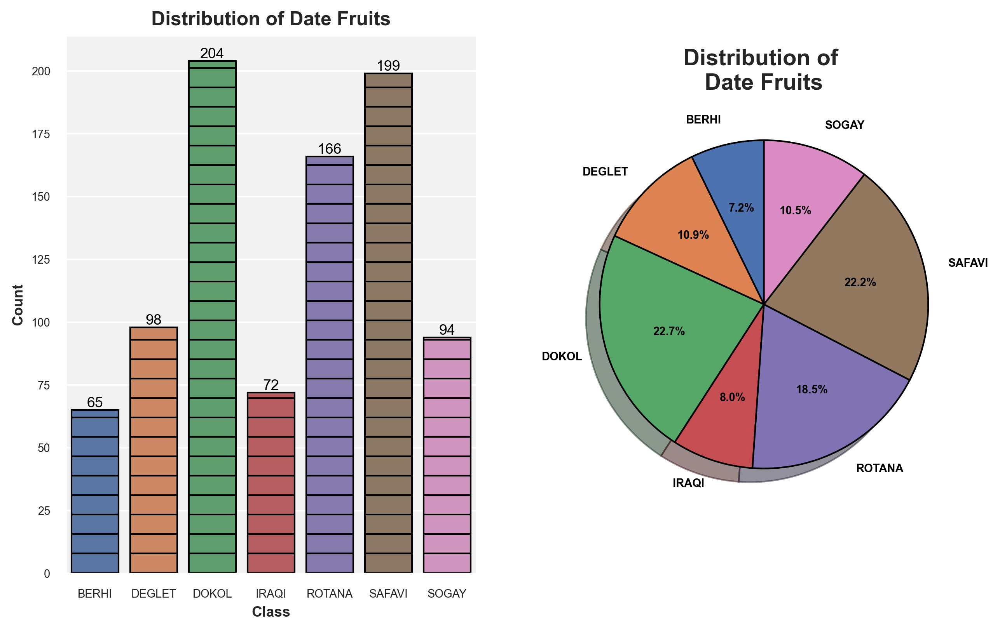

In [11]:
type_dict = df["Class"].value_counts().to_dict()
type_dict = OrderedDict(sorted(type_dict.items()))
type_label = type_dict.keys()
type_value = type_dict.values()
explode = (0,)*df["Class"].nunique()

fig, ax = plt.subplots(1,2, facecolor='white')
sns.countplot(data=df, x="Class", edgecolor="black", hatch="-", ax=ax[0])
ax[0].set_title("Distribution of Date Fruits", size=12, fontweight="bold")
ax[0].set_xlabel("Class", size=9, fontweight="bold")
ax[0].set_ylabel("Count", size=9, fontweight="bold")
ax[0].tick_params(axis="x", labelsize=7) 
ax[0].tick_params(axis="y", labelsize=7)
ax[0].bar_label(ax[0].containers[0], fmt='%.0f', color="black", fontsize=9)

plt.pie(type_value, explode=explode, labels=type_label, autopct='%1.1f%%', shadow=True,
        startangle=90, textprops={'fontsize': 7, "fontweight" : "bold", "color":"black"},  wedgeprops=
       {'edgecolor':'black'} , labeldistance=1.15)
plt.title("Distribution of \nDate Fruits", size=14, fontweight="bold")

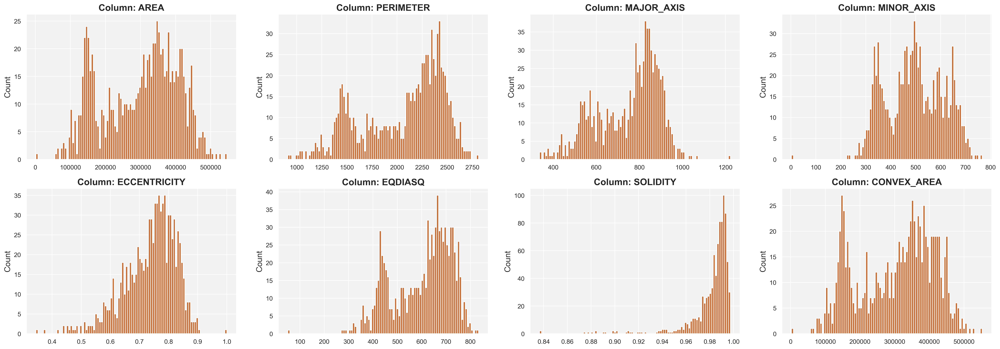

In [12]:
cols = ["AREA", "PERIMETER", "MAJOR_AXIS", "MINOR_AXIS", "ECCENTRICITY", "EQDIASQ", "SOLIDITY", "CONVEX_AREA"]
fig_nr_columns = 4
fig_nr_rows = 1 + (len(cols) // fig_nr_columns) if len(cols) % fig_nr_columns != 0 else len(cols) // fig_nr_columns
fig = plt.figure(1, figsize=[30,10])

for k in range(len(cols)):
    num_bins = 100
    ax = fig.add_subplot(fig_nr_rows, fig_nr_columns, k+1)
    ax.hist(df[cols[k]], num_bins, color='#C76F39')
    plt.title("Column: {}".format(cols[k]), fontweight='bold',fontsize=16)
    plt.ylabel("Count", fontsize=14)

plt.show()

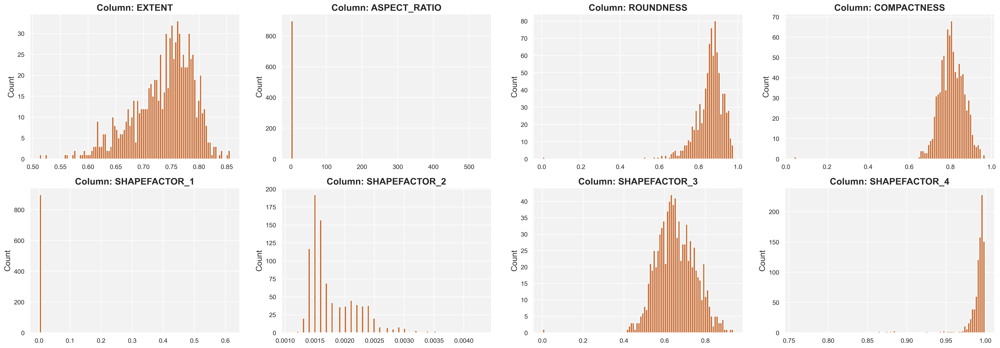

In [13]:
cols = ["EXTENT", "ASPECT_RATIO", "ROUNDNESS", "COMPACTNESS", "SHAPEFACTOR_1", "SHAPEFACTOR_2", "SHAPEFACTOR_3", "SHAPEFACTOR_4"]
fig_nr_columns = 4
fig_nr_rows = 1 + (len(cols) // fig_nr_columns) if len(cols) % fig_nr_columns != 0 else len(cols) // fig_nr_columns
fig = plt.figure(1, figsize=[30,10])

for k in range(len(cols)):
    num_bins = 100
    ax = fig.add_subplot(fig_nr_rows, fig_nr_columns, k+1)
    ax.hist(df[cols[k]], num_bins, color='#C76F39')
    plt.title("Column: {}".format(cols[k]), fontweight='bold',fontsize=16)
    plt.ylabel("Count", fontsize=14)

plt.show()

There probably is an outlier in the column ASPECT_RATIO

In [14]:
print(df["ASPECT_RATIO"].max())

535.5257


This confirms it. It shall be removed in the future

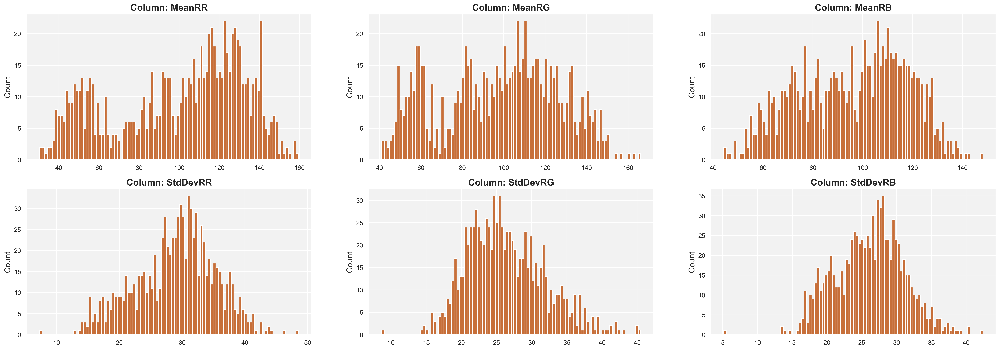

In [15]:
cols = ["MeanRR", "MeanRG", "MeanRB", "StdDevRR", "StdDevRG", "StdDevRB"]
fig_nr_columns = 3
fig_nr_rows = 1 + (len(cols) // fig_nr_columns) if len(cols) % fig_nr_columns != 0 else len(cols) // fig_nr_columns
fig = plt.figure(1, figsize=[30,10])

for k in range(len(cols)):
    num_bins = 100
    ax = fig.add_subplot(fig_nr_rows, fig_nr_columns, k+1)
    ax.hist(df[cols[k]], num_bins, color='#C76F39')
    plt.title("Column: {}".format(cols[k]), fontweight='bold',fontsize=16)
    plt.ylabel("Count", fontsize=14)

plt.show()

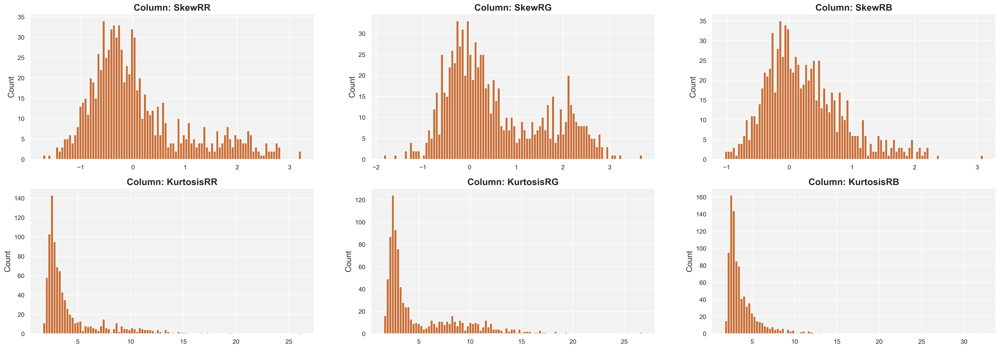

In [16]:
cols = ["SkewRR", "SkewRG", "SkewRB", "KurtosisRR", "KurtosisRG", "KurtosisRB"]
fig_nr_columns = 3
fig_nr_rows = 1 + (len(cols) // fig_nr_columns) if len(cols) % fig_nr_columns != 0 else len(cols) // fig_nr_columns
fig = plt.figure(1, figsize=[30,10])

for k in range(len(cols)):
    num_bins = 100
    ax = fig.add_subplot(fig_nr_rows, fig_nr_columns, k+1)
    ax.hist(df[cols[k]], num_bins, color='#C76F39')
    plt.title("Column: {}".format(cols[k]), fontweight='bold',fontsize=16)
    plt.ylabel("Count", fontsize=14)

plt.show()

<Axes: >

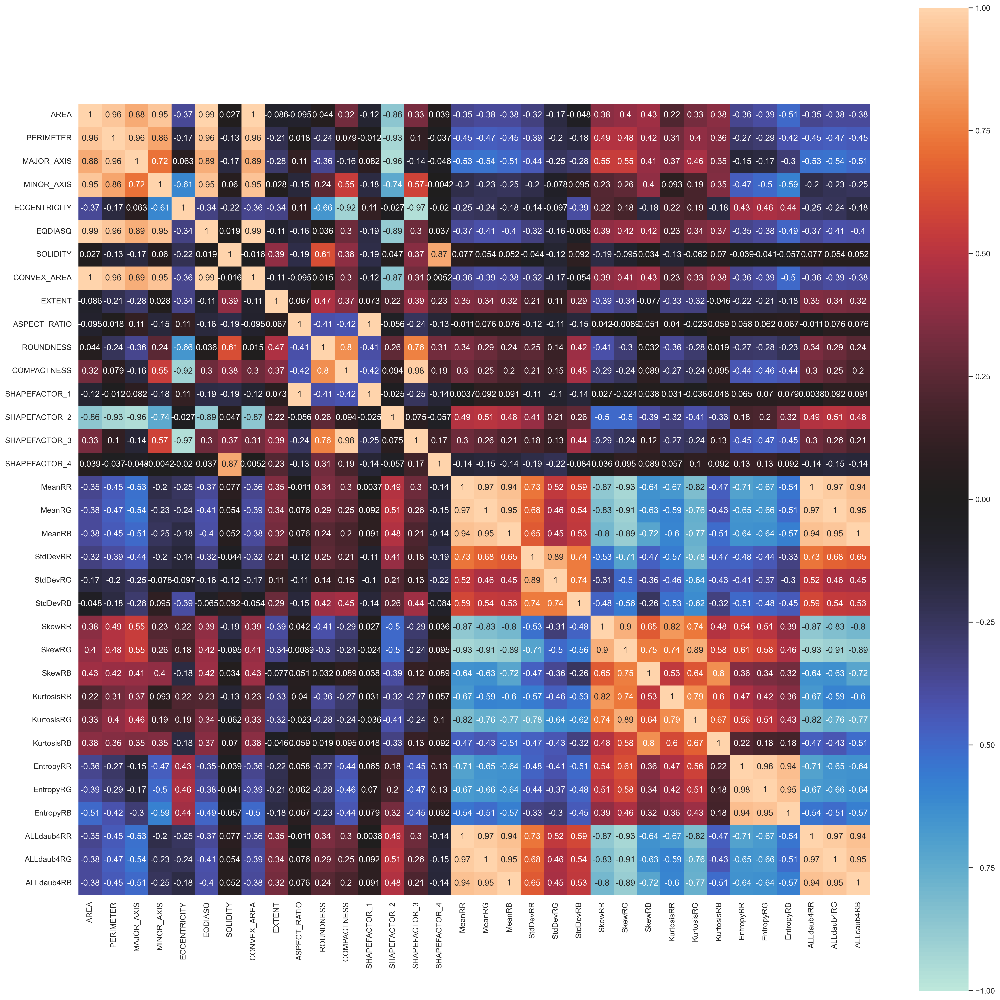

In [17]:
#correlation matrix
corrmat= df.corr(numeric_only = True)
plt.figure(figsize=(25,25))  
sns.heatmap(corrmat,square=True,annot=True, vmin=-1, vmax=1,center=0)

There's a bunch of perfectly correlated columns, so it was decided to drop the following columns:
- EQDIASQ (perfectly correlated with AREA)
- CONVEX_AREA (same as EQDIASQ)
- SHAPEFACTOR_3 (perfectly correlated with COMPACTNESS)
- ALLdaub4RR, ALLdaub4RG, ALLdaub4RB (perfectly correlated with MeanRR, MeanRG, MeanRB, respectively)

In [18]:
df = df.drop(['EQDIASQ', 'CONVEX_AREA', 'SHAPEFACTOR_3', 'ALLdaub4RR', 'ALLdaub4RG', 'ALLdaub4RB'], axis=1)

### Label encoding

In [19]:
from sklearn.preprocessing import LabelEncoder

In [20]:
label_encoder = LabelEncoder()

In [21]:
class_new = pd.DataFrame(label_encoder.fit_transform(df['Class']),columns=['Labeled Class'])

In [22]:
class_new.head()

,Labeled Class
0,0
1,0
2,0
3,0
4,0


In [23]:
df_copy = df.copy()
df_copy.shape

(898, 29)

In [24]:
df_copy = pd.concat([df_copy,class_new],axis=1)
df_copy.shape

(898, 30)

In [25]:
df_copy['Labeled Class'].fillna(0,inplace=True)

In [26]:
df_copy

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,SOLIDITY,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,...,SkewRG,SkewRB,KurtosisRR,KurtosisRG,KurtosisRB,EntropyRR,EntropyRG,EntropyRB,Class,Labeled Class
0,422163,2378.9080,837.8484,645.6693,0.6373,0.9947,0.7831,1.2976,0.9374,0.8750,...,-0.0114,0.6019,3.2370,2.9574,4.2287,-59191263232,-50714214400,-39922372608,BERHI,0
1,338136,2085.1440,723.8198,595.2073,0.5690,0.9974,0.7795,1.2161,0.9773,0.9065,...,0.1349,0.4134,2.6228,2.6350,3.1704,-34233065472,-37462601728,-31477794816,BERHI,0
2,526843,2647.3940,940.7379,715.3638,0.6494,0.9962,0.7657,1.3150,0.9446,0.8706,...,-0.1059,0.9183,3.7516,3.8611,4.7192,-93948354560,-74738221056,-60311207936,BERHI,0
3,416063,2351.2100,827.9804,645.2988,0.6266,0.9948,0.7759,1.2831,0.9458,0.8791,...,1.2917,1.8028,5.0401,8.6136,8.2618,-32074307584,-32060925952,-29575010304,BERHI,0
4,347562,2160.3540,763.9877,582.8359,0.6465,0.9908,0.7569,1.3108,0.9358,0.8707,...,0.2101,0.8865,2.7016,2.9761,4.4146,-39980974080,-35980042240,-25593278464,BERHI,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
893,255403,1925.3650,691.8453,477.1796,0.7241,0.9785,0.7269,1.4499,0.8658,0.8243,...,-0.0339,-0.1398,2.2423,2.3704,2.7202,-25296416768,-19168882688,-18473392128,SOGAY,6
894,365924,2664.8230,855.4633,551.5447,0.7644,0.9466,0.6695,1.5510,0.6475,0.7979,...,0.5663,0.5611,3.4109,3.5805,3.9910,-31605219328,-21945366528,-19277905920,SOGAY,6
895,254330,1926.7360,747.4943,435.6219,0.8126,0.9925,0.7240,1.7159,0.8609,0.7613,...,0.6385,0.2665,2.2759,2.5090,2.6951,-22242772992,-19594921984,-17592152064,SOGAY,6
896,238955,1906.2679,716.6485,441.8297,0.7873,0.9604,0.6954,1.6220,0.8263,0.7697,...,0.8228,0.5325,2.6769,2.6874,2.7991,-26048595968,-21299822592,-19809978368,SOGAY,6


In [27]:
df_copy.drop(columns=['Class'],axis=1,inplace=True)

### Removing Outliers

In [28]:
Q1 = df_copy.quantile(0.25)
Q3 = df_copy.quantile(0.75)
IQR = Q3 - Q1

df_copy = df_copy[~((df_copy < (Q1 - 1.5 * IQR)) | (df_copy > (Q3 + 1.5 * IQR))).any(axis=1)]

Removed outliers

In [29]:
print(df_copy.max())
df_copy.isnull().sum()

AREA             5.147450e+05
PERIMETER        2.718394e+03
MAJOR_AXIS       1.040528e+03
MINOR_AXIS       7.358910e+02
ECCENTRICITY     8.757000e-01
SOLIDITY         9.974000e-01
EXTENT           8.562000e-01
ASPECT_RATIO     2.070900e+00
ROUNDNESS        9.773000e-01
COMPACTNESS      9.248000e-01
SHAPEFACTOR_1    4.400000e-03
SHAPEFACTOR_2    2.900000e-03
SHAPEFACTOR_4    9.995000e-01
MeanRR           1.574652e+02
MeanRG           1.610358e+02
MeanRB           1.411264e+02
StdDevRR         4.328320e+01
StdDevRG         4.129780e+01
StdDevRB         3.858650e+01
SkewRR           1.628600e+00
SkewRG           2.812400e+00
SkewRB           1.639000e+00
KurtosisRR       7.243400e+00
KurtosisRG       1.444610e+01
KurtosisRB       6.799900e+00
EntropyRR       -2.989908e+09
EntropyRG       -5.908136e+09
EntropyRB       -7.991440e+09
Labeled Class    6.000000e+00
dtype: float64


AREA             0
PERIMETER        0
MAJOR_AXIS       0
MINOR_AXIS       0
ECCENTRICITY     0
SOLIDITY         0
EXTENT           0
ASPECT_RATIO     0
ROUNDNESS        0
COMPACTNESS      0
SHAPEFACTOR_1    0
SHAPEFACTOR_2    0
SHAPEFACTOR_4    0
MeanRR           0
MeanRG           0
MeanRB           0
StdDevRR         0
StdDevRG         0
StdDevRB         0
SkewRR           0
SkewRG           0
SkewRB           0
KurtosisRR       0
KurtosisRG       0
KurtosisRB       0
EntropyRR        0
EntropyRG        0
EntropyRB        0
Labeled Class    0
dtype: int64

<Figure size 3000x1800 with 0 Axes>

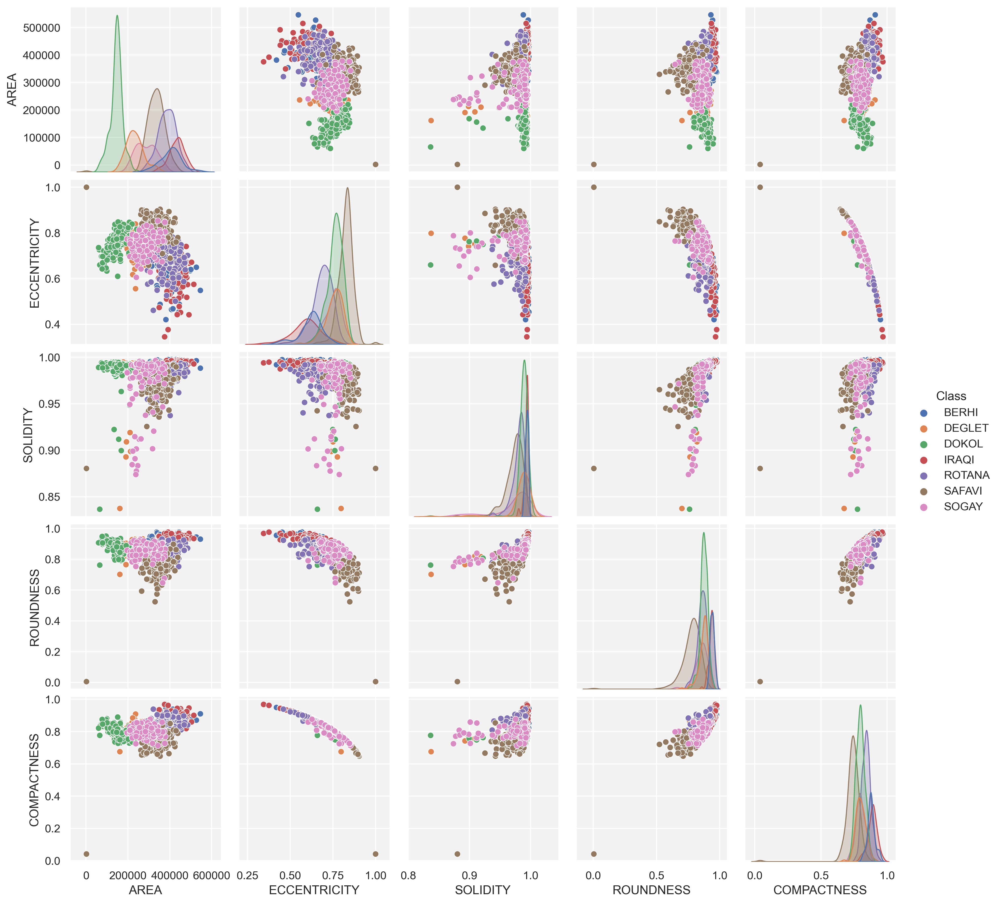

In [30]:
To_Plot = ["Class", "AREA", "ECCENTRICITY", "SOLIDITY", "ROUNDNESS", "COMPACTNESS"]
plt.figure()
sns.pairplot(df[To_Plot], hue= "Class")
plt.show()

<Axes: >

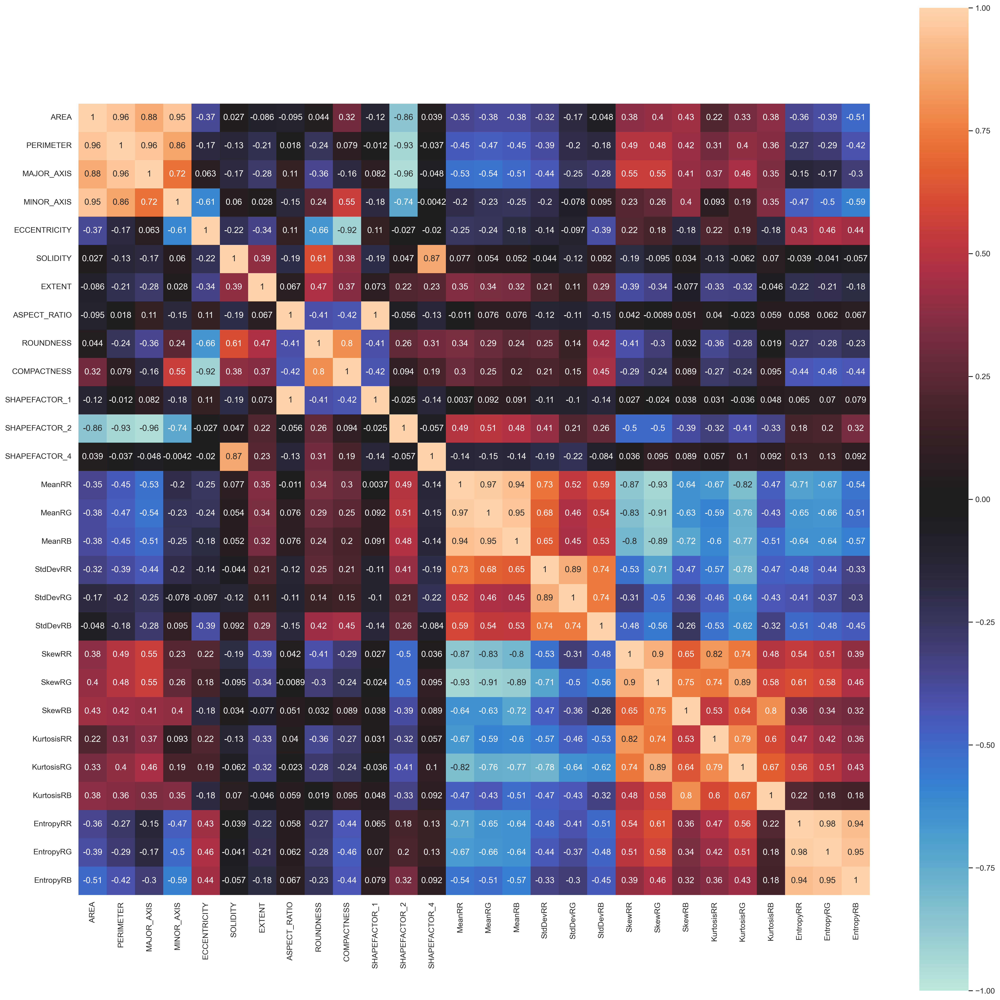

In [31]:
#correlation matrix
corrmat= df.corr(numeric_only = True)
plt.figure(figsize=(25,25))  
sns.heatmap(corrmat,square=True,annot=True, vmin=-1, vmax=1,center=0)

### Ficheiro

In [32]:
df_copy.to_csv('fruitdatafinal.csv')

---
### Model Training and Testing

In [33]:
X = df_copy.drop(['Labeled Class'],axis=1)
y = df_copy['Labeled Class']

In [34]:
X

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,SOLIDITY,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,...,StdDevRB,SkewRR,SkewRG,SkewRB,KurtosisRR,KurtosisRG,KurtosisRB,EntropyRR,EntropyRG,EntropyRB
0,422163,2378.9080,837.8484,645.6693,0.6373,0.9947,0.7831,1.2976,0.9374,0.8750,...,30.1230,-0.5661,-0.0114,0.6019,3.2370,2.9574,4.2287,-59191263232,-50714214400,-39922372608
1,338136,2085.1440,723.8198,595.2073,0.5690,0.9974,0.7795,1.2161,0.9773,0.9065,...,28.1229,-0.2328,0.1349,0.4134,2.6228,2.6350,3.1704,-34233065472,-37462601728,-31477794816
4,347562,2160.3540,763.9877,582.8359,0.6465,0.9908,0.7569,1.3108,0.9358,0.8707,...,27.1741,-0.3552,0.2101,0.8865,2.7016,2.9761,4.4146,-39980974080,-35980042240,-25593278464
5,408953,2326.6931,840.1821,622.0076,0.6722,0.9974,0.7805,1.3508,0.9493,0.8589,...,32.7977,0.1189,0.9400,1.5571,3.6309,6.0285,6.2159,-41140371456,-33146710016,-27907301376
6,451414,2457.2080,889.3253,652.4316,0.6796,0.9970,0.7877,1.3631,0.9395,0.8525,...,33.8446,0.0606,0.4530,0.9431,3.0703,3.4163,4.9168,-63711666176,-64060743680,-52603465728
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
891,283636,2036.3490,751.8530,482.4856,0.7669,0.9819,0.7005,1.5583,0.8595,0.7993,...,25.7324,-0.1154,0.1158,0.1958,2.1874,2.0473,2.8280,-26821468160,-23290361856,-16920019968
892,313194,2095.9231,769.1030,519.8459,0.7370,0.9905,0.7231,1.4795,0.8959,0.8211,...,25.2565,-0.0165,0.3024,0.1028,2.1584,2.1710,2.3135,-28769253376,-24705204224,-23276603392
893,255403,1925.3650,691.8453,477.1796,0.7241,0.9785,0.7269,1.4499,0.8658,0.8243,...,26.7208,-0.2737,-0.0339,-0.1398,2.2423,2.3704,2.7202,-25296416768,-19168882688,-18473392128
895,254330,1926.7360,747.4943,435.6219,0.8126,0.9925,0.7240,1.7159,0.8609,0.7613,...,29.0821,0.1838,0.6385,0.2665,2.2759,2.5090,2.6951,-22242772992,-19594921984,-17592152064


### Standard Scalling

In [35]:
from sklearn.preprocessing import StandardScaler

In [36]:
standard_scaler = StandardScaler()

In [37]:
X = standard_scaler.fit_transform(X)

### Splitting Data Set for model training and testing

In [38]:
from sklearn.model_selection import train_test_split

In [39]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

<Axes: xlabel='Labeled Class', ylabel='count'>

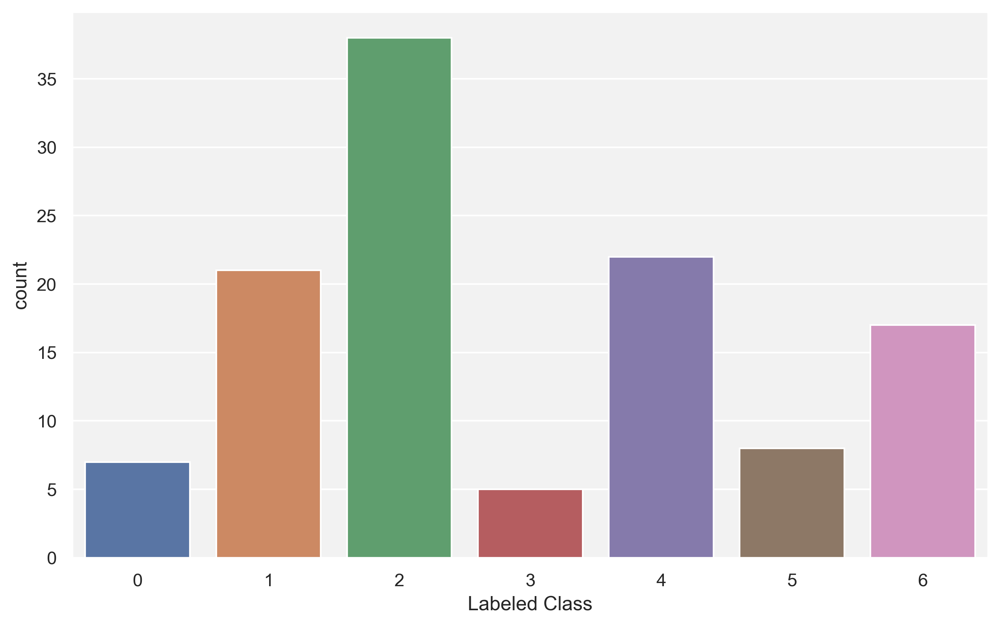

In [40]:
sns.countplot(x=y_test)

LinearRegression
----------------------------

In [41]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

In [42]:
X = df_copy.drop(['Labeled Class'],axis=1) 

In [43]:
y = df_copy['Labeled Class']

In [44]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [45]:
model = LinearRegression()

In [46]:
model.fit(X_train, y_train)

LinearRegression()

In [47]:
predictions = model.predict(X_test)

In [48]:
print(predictions)

[5.71738249 1.19621142 5.23575771 3.40465683 2.02913882 3.39608154
 1.84668729 2.66075906 3.78866785 1.55572232 4.28304473 1.4240298
 2.61600403 2.11389543 3.17487768 1.98956111 1.50950671 3.84628882
 5.39063644 2.42555338 1.21995565 1.13861521 1.99383599 3.54536838
 1.85083301 1.85191959 2.41921265 4.29764223 2.74825475 1.88661499
 5.32125395 1.41402057 3.93024977 2.23888572 1.97240661 2.36028792
 1.68305939 2.5200023  4.13027953 3.99599761 2.07436536 1.13852319
 1.36143066 1.80793402 3.80803729 4.1727542  2.25147531 5.48810472
 3.41940377 2.52041437 2.74038758 3.765077   1.74017808 4.07140096
 1.36628263 2.70238463 3.36640163 3.75883865 2.69520184 1.99606149
 3.08962418 4.00095753 3.96938122 2.14042783 2.29059223 1.49837993
 3.92558667 3.73576521 4.19766206 2.49683571 4.80335403 1.49275333
 3.36200898 2.2382665  2.65554519 5.59451993 2.09623792 2.57893064
 1.80276585 0.94081493 1.35867866 1.71110834 4.58271617 2.59393301
 4.01622243 2.38215351 1.44744479 3.79414534 1.83892424 2.24432

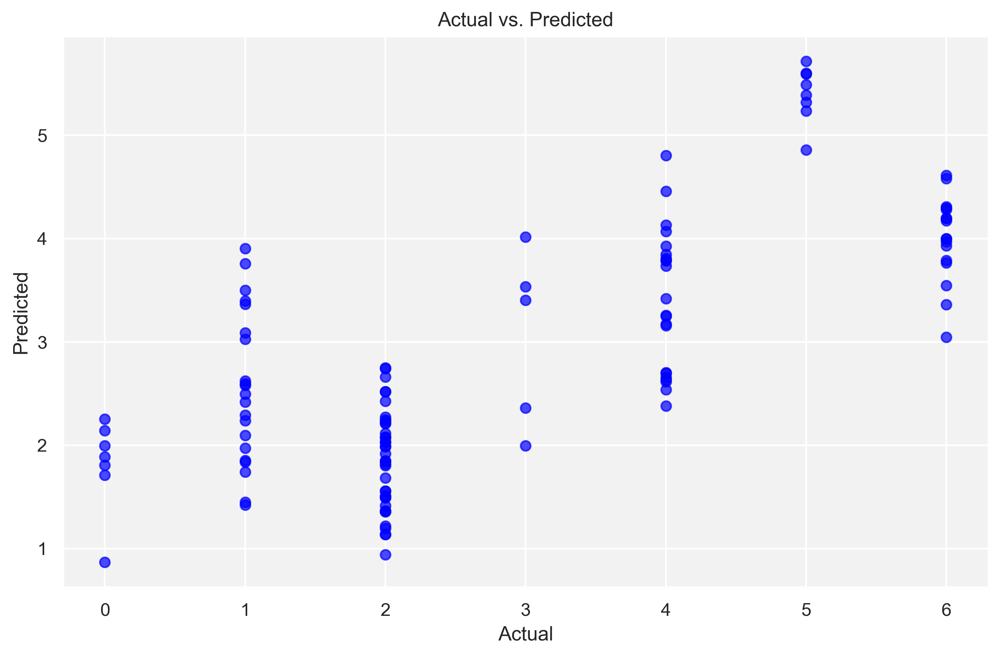

In [49]:
plt.scatter(y_test, predictions, color='blue', alpha=0.7)

plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs. Predicted")
plt.show()

In [50]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Calcula o erro absoluto médio
mae = mean_absolute_error(y_test, predictions)
print(f'Mean Absolute Error: {mae}')

# Calcula o erro quadrático médio
mse = mean_squared_error(y_test, predictions)
print(f'Mean Squared Error: {mse}')

# Calcula o coeficiente de determinação (R-squared)
r2 = r2_score(y_test, predictions)
print(f'R-squared: {r2}')

Mean Absolute Error: 0.9992752679727014
Mean Squared Error: 1.5943147572729504
R-squared: 0.5185800078012541


Logistic regression
-------------------------------

In [51]:
X = df_copy.drop(['Labeled Class'],axis=1)
y = df_copy['Labeled Class']

In [52]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [53]:
logistic_regression = LogisticRegression(multi_class='multinomial')

In [54]:
logistic_regression.fit(X_train,y_train)

LogisticRegression(multi_class='multinomial')

In [55]:
y_predict = logistic_regression.predict(X_test)

In [56]:
logistic_regression.score(X_train, y_train)

0.5234042553191489

In [57]:
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         7
           1       0.00      0.00      0.00        21
           2       0.68      0.55      0.61        38
           3       0.25      0.20      0.22         5
           4       0.29      0.77      0.42        22
           5       0.78      0.88      0.82         8
           6       0.69      0.65      0.67        17

    accuracy                           0.48       118
   macro avg       0.38      0.44      0.39       118
weighted avg       0.44      0.48      0.44       118



In [58]:
print(confusion_matrix(y_test,y_predict))

[[ 0  0  1  2  3  0  1]
 [ 0  0  3  0 14  1  3]
 [ 0  0 21  0 16  0  1]
 [ 0  0  1  1  2  1  0]
 [ 0  0  5  0 17  0  0]
 [ 0  0  0  1  0  7  0]
 [ 0  0  0  0  6  0 11]]


<Axes: >

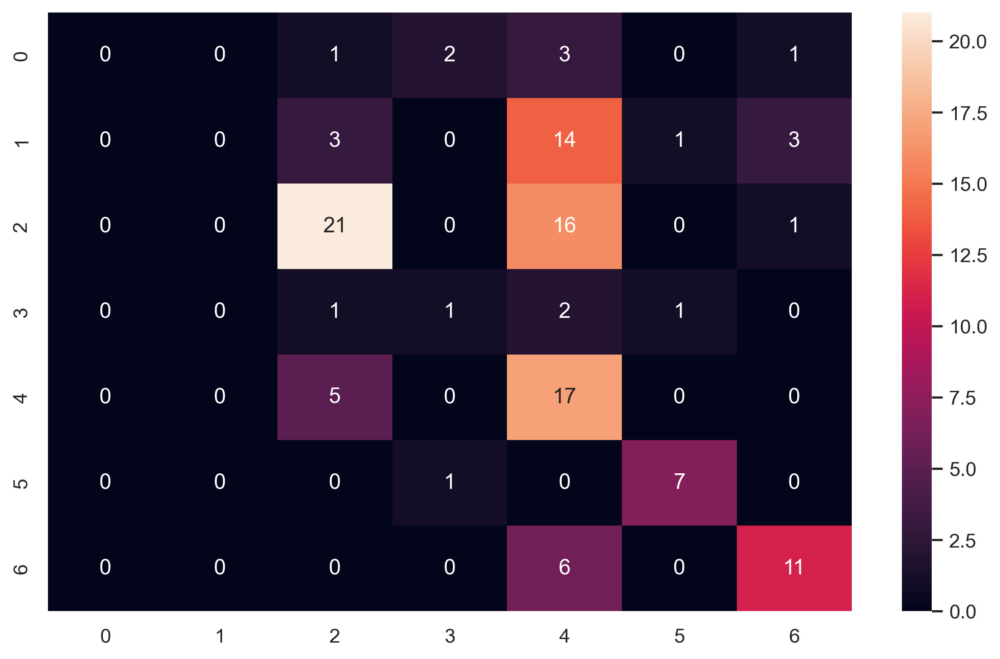

In [59]:
sns.heatmap(confusion_matrix(y_test,y_predict),annot=True)

Decision Tree Classifier
----------------------------

In [60]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

In [61]:
dt_model=DecisionTreeClassifier(random_state=2022)

In [62]:
dt_model.fit(X_train,y_train)

DecisionTreeClassifier(random_state=2022)

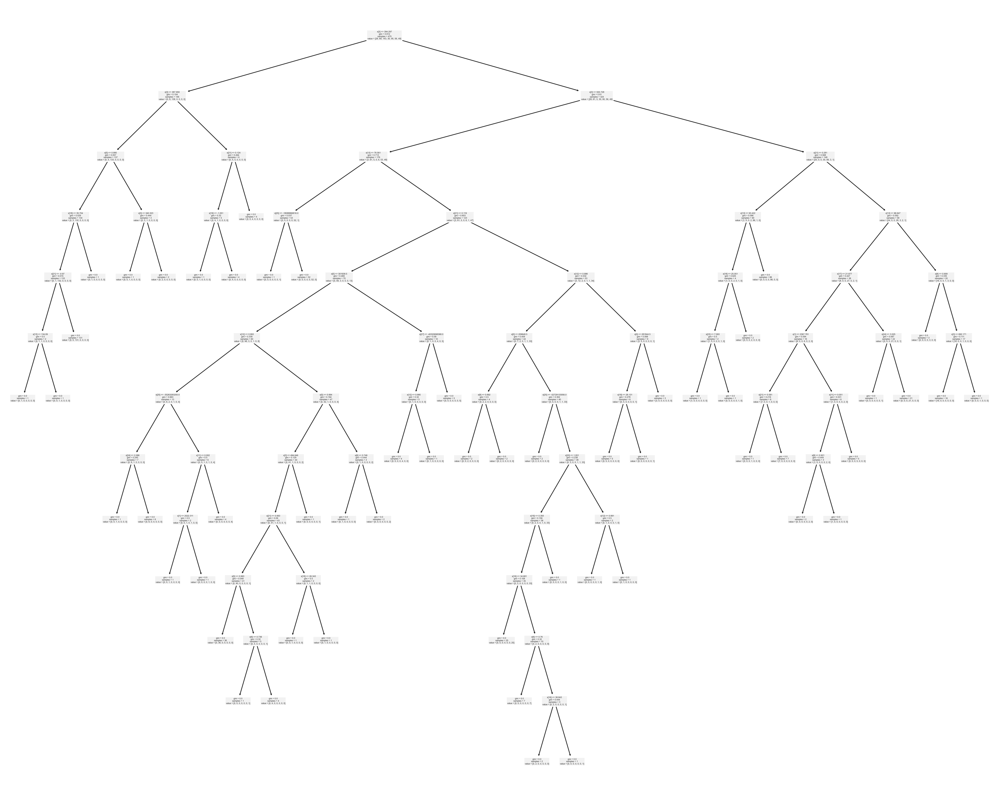

In [63]:
fig=plt.figure(figsize=(25,20))
tree.plot_tree(dt_model)
plt.show()

fig.savefig("dt_plot.png")

In [64]:
text_representation=tree.export_text(dt_model)
print(text_representation)

with open("dt_text.log","w") as fout:
    fout.write(text_representation)

|--- feature_3 <= 394.30
|   |--- feature_3 <= 387.96
|   |   |--- feature_5 <= 0.99
|   |   |   |--- feature_18 <= 35.70
|   |   |   |   |--- feature_21 <= -0.97
|   |   |   |   |   |--- feature_13 <= 134.09
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_13 >  134.09
|   |   |   |   |   |   |--- class: 2
|   |   |   |   |--- feature_21 >  -0.97
|   |   |   |   |   |--- class: 2
|   |   |   |--- feature_18 >  35.70
|   |   |   |   |--- class: 1
|   |   |--- feature_5 >  0.99
|   |   |   |--- feature_3 <= 340.32
|   |   |   |   |--- class: 2
|   |   |   |--- feature_3 >  340.32
|   |   |   |   |--- class: 1
|   |--- feature_3 >  387.96
|   |   |--- feature_21 <= 0.12
|   |   |   |--- feature_19 <= -1.05
|   |   |   |   |--- class: 2
|   |   |   |--- feature_19 >  -1.05
|   |   |   |   |--- class: 1
|   |   |--- feature_21 >  0.12
|   |   |   |--- class: 2
|--- feature_3 >  394.30
|   |--- feature_3 <= 555.73
|   |   |--- feature_13 <= 76.56
|   |   |   |--- featu

In [65]:
dt_predictions=dt_model.predict(X_test)

In [66]:
from sklearn.metrics import classification_report, ConfusionMatrixDisplay

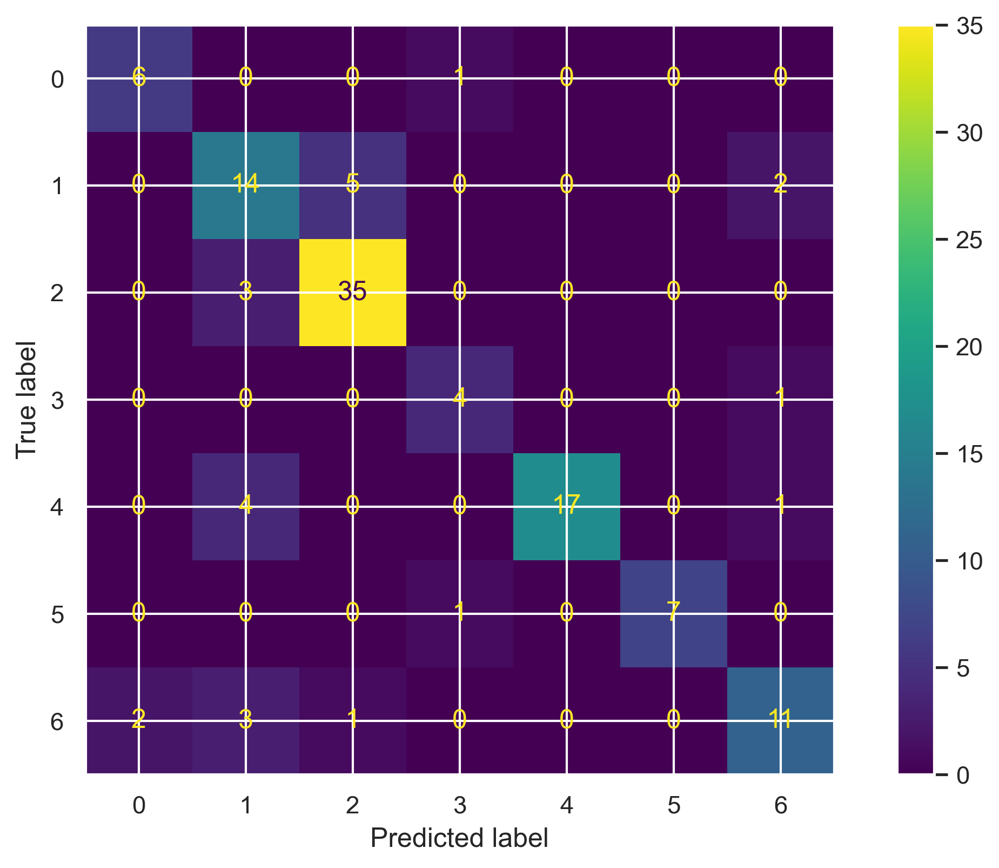

In [67]:
ConfusionMatrixDisplay.from_predictions(y_test, dt_predictions)
plt.show()

In [68]:
print(classification_report(y_test, dt_predictions))

              precision    recall  f1-score   support

           0       0.75      0.86      0.80         7
           1       0.58      0.67      0.62        21
           2       0.85      0.92      0.89        38
           3       0.67      0.80      0.73         5
           4       1.00      0.77      0.87        22
           5       1.00      0.88      0.93         8
           6       0.73      0.65      0.69        17

    accuracy                           0.80       118
   macro avg       0.80      0.79      0.79       118
weighted avg       0.81      0.80      0.80       118



Hyperparameter Tuning with GridSearchCV
-------------------------------------------

In [69]:
from sklearn.model_selection import GridSearchCV

In [70]:
print(dt_model.get_depth())
print(dt_model.get_n_leaves())

12
54


In [71]:
param_grid_dt={'criterion': ['gini','entropy'], 'max_depth': [1,2,3,4,5,6,7,8,10]}
estimator_dt=DecisionTreeClassifier(random_state=2022)
grid_dt=GridSearchCV(estimator_dt, param_grid_dt, refit=True, verbose=2)

In [72]:
grid_dt.fit(X_train,y_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV] END ........................criterion=gini, max_depth=1; total time=   0.0s
[CV] END ........................criterion=gini, max_depth=1; total time=   0.0s
[CV] END ........................criterion=gini, max_depth=1; total time=   0.0s
[CV] END ........................criterion=gini, max_depth=1; total time=   0.0s
[CV] END ........................criterion=gini, max_depth=1; total time=   0.0s
[CV] END ........................criterion=gini, max_depth=2; total time=   0.0s
[CV] END ........................criterion=gini, max_depth=2; total time=   0.0s
[CV] END ........................criterion=gini, max_depth=2; total time=   0.0s
[CV] END ........................criterion=gini, max_depth=2; total time=   0.0s
[CV] END ........................criterion=gini, max_depth=2; total time=   0.0s
[CV] END ........................criterion=gini, max_depth=3; total time=   0.0s
[CV] END ........................criterion=gini,

GridSearchCV(estimator=DecisionTreeClassifier(random_state=2022),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 10]},
             verbose=2)

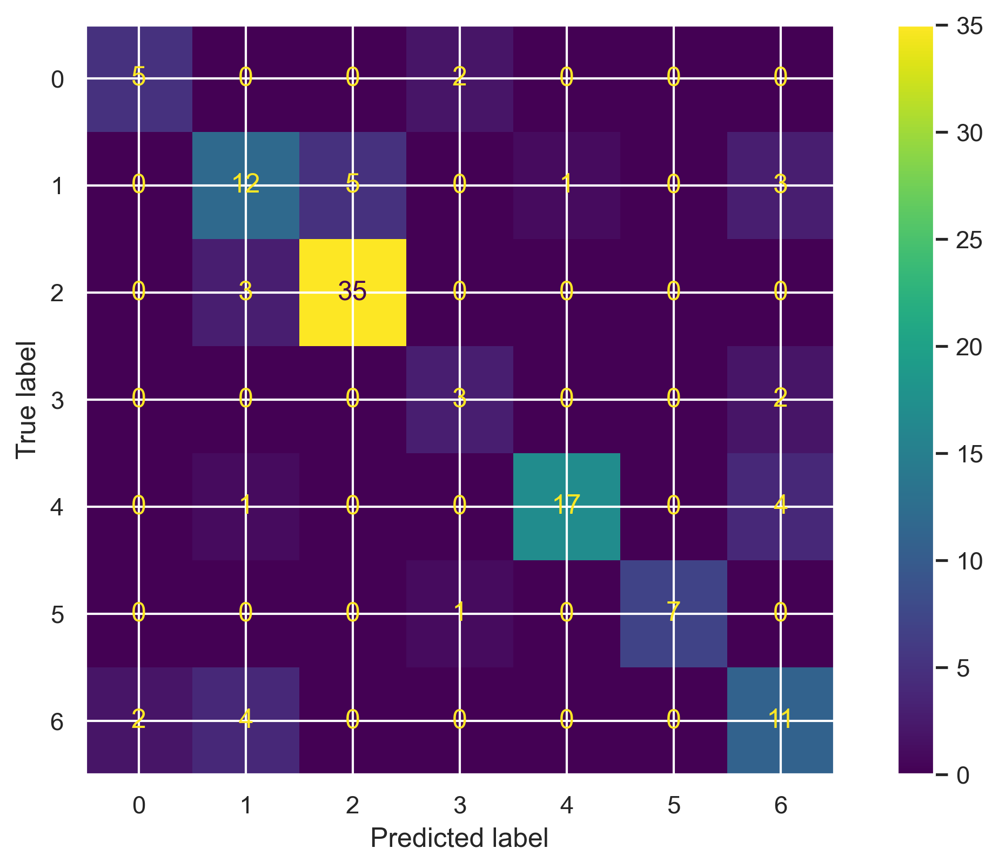

In [73]:
ConfusionMatrixDisplay.from_predictions(y_test,grid_dt.predict(X_test))
plt.show()

In [74]:
print(classification_report(y_test,grid_dt.predict(X_test)))

              precision    recall  f1-score   support

           0       0.71      0.71      0.71         7
           1       0.60      0.57      0.59        21
           2       0.88      0.92      0.90        38
           3       0.50      0.60      0.55         5
           4       0.94      0.77      0.85        22
           5       1.00      0.88      0.93         8
           6       0.55      0.65      0.59        17

    accuracy                           0.76       118
   macro avg       0.74      0.73      0.73       118
weighted avg       0.78      0.76      0.77       118



Decision Tree Pruning
------------------------

In [75]:
print(dt_model.get_depth())
print(dt_model.get_n_leaves())

12
54


In [76]:
max_depth=dt_model.get_depth()
max_depth

12

In [77]:
param_grid = {'max_depth':[max_depth for max_depth in range (1,max_depth + 1)]}
estimator = DecisionTreeClassifier(random_state=42)
max_depth_grid_search=GridSearchCV(estimator,param_grid)

In [78]:
max_depth_grid_search.fit(X_train,y_train)

GridSearchCV(estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]})

In [79]:
max_depth_grid_search.best_params_

{'max_depth': 6}

In [80]:
max_depth_tree = max_depth_grid_search.best_estimator_
print(max_depth_tree)

DecisionTreeClassifier(max_depth=6, random_state=42)


In [81]:
best_max_depth = max_depth_tree.get_depth()
print(best_max_depth)

6


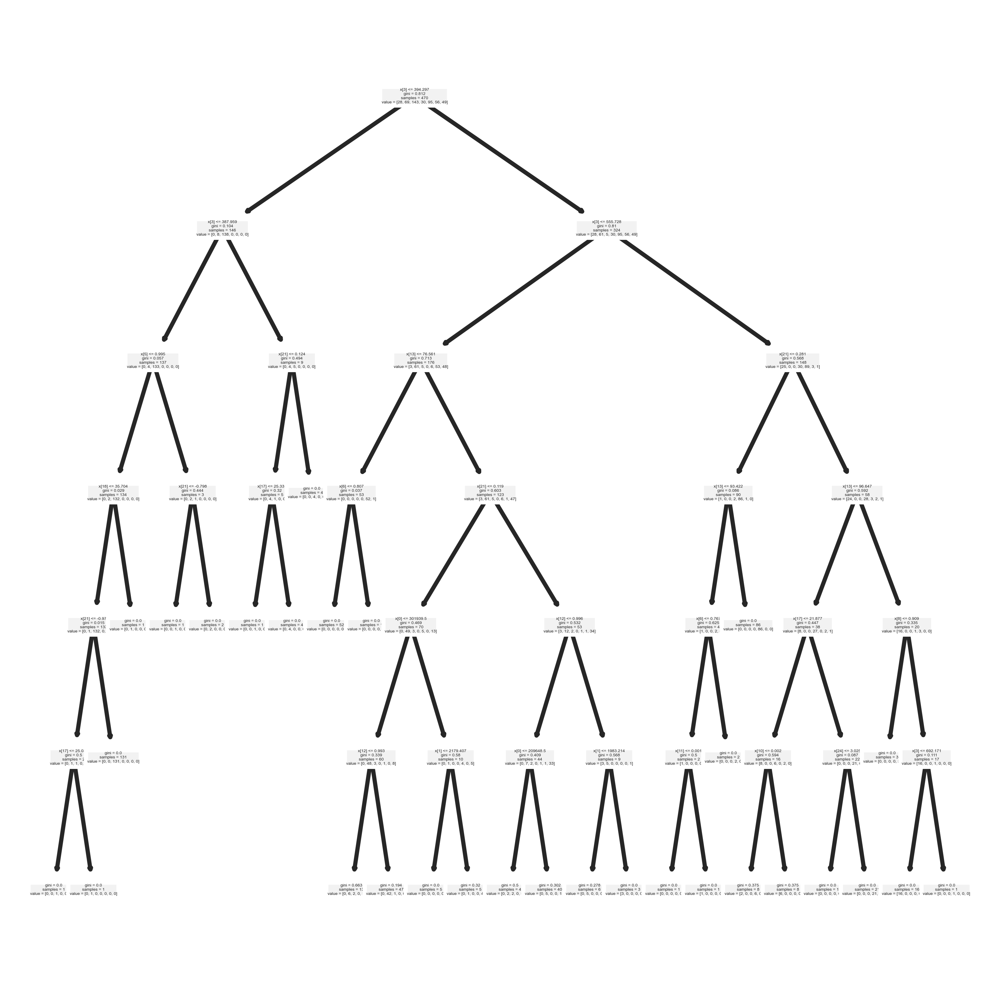

In [82]:
plt.figure(figsize=(4,4), dpi=1000)
tree.plot_tree(max_depth_tree)
plt.show()
fig.savefig("dt_p1_plot.png")

In [83]:
print(classification_report(y_test, max_depth_tree.predict(X_test)))

              precision    recall  f1-score   support

           0       0.67      0.86      0.75         7
           1       0.57      0.57      0.57        21
           2       0.87      0.89      0.88        38
           3       0.80      0.80      0.80         5
           4       0.94      0.77      0.85        22
           5       1.00      0.88      0.93         8
           6       0.58      0.65      0.61        17

    accuracy                           0.77       118
   macro avg       0.78      0.77      0.77       118
weighted avg       0.78      0.77      0.77       118



In [84]:
ccp_alphas = dt_model.cost_complexity_pruning_path(X_train, y_train)["ccp_alphas"]

In [85]:
ccp_alphas

array([0.        , 0.00205344, 0.00211166, 0.00212766, 0.00212766,
       0.00212766, 0.00267477, 0.00283688, 0.00283688, 0.00283688,
       0.00319149, 0.00340426, 0.00340426, 0.0035461 , 0.00364742,
       0.0037234 , 0.00387522, 0.00391422, 0.00400501, 0.0040619 ,
       0.00416029, 0.00417503, 0.00425532, 0.00425532, 0.00444943,
       0.00519472, 0.00530381, 0.00605201, 0.00619664, 0.00620567,
       0.00648376, 0.00696383, 0.00732861, 0.00744681, 0.00829787,
       0.00893617, 0.01025031, 0.01080334, 0.01118203, 0.01189555,
       0.01411348, 0.0225752 , 0.02813341, 0.08945151, 0.10475627,
       0.11229595, 0.22207694])

In [86]:
estimator.get_params().keys()

dict_keys(['ccp_alpha', 'class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'random_state', 'splitter'])

In [87]:
param_grid={'ccp_alpha': [alpha for alpha in ccp_alphas]}

estimator_dt=DecisionTreeClassifier(random_state=42)
ccp_alpha_grid_search=GridSearchCV(estimator_dt, param_grid)
ccp_alpha_grid_search.fit(X_train,y_train)

GridSearchCV(estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'ccp_alpha': [0.0, 0.002053438891637804,
                                       0.0021116621340585575,
                                       0.002127659574468085,
                                       0.002127659574468085,
                                       0.002127659574468085,
                                       0.0026747720364741633,
                                       0.0028368794326241132,
                                       0.0028368794326241132,
                                       0.0028368794326241132,
                                       0.0031914893617021275,
                                       0.0034042553191489353,
                                       0.0034042553191489353,
                                       0.003546099290780142,
                                       0.003647416413373861,
                                       0.003723404255319149,
                                       0.0038752192883810856,
                                       0.003914218169537324,
                                       0.0040050062578222785,
                                       0.004061895551257255,
                                       0.0041602895775481675,
                                       0.0041750301083902, 0.004255319148936169,
                                       0.00425531914893617,
                                       0.004449428645897636,
                                       0.005194724399651605,
                                       0.005303811738017469,
                                       0.0060520094562647765,
                                       0.006196638019413208,
                                       0.006205673758865248, ...]})

In [88]:
ccp_alpha_grid_search.best_params_

{'ccp_alpha': 0.004449428645897636}

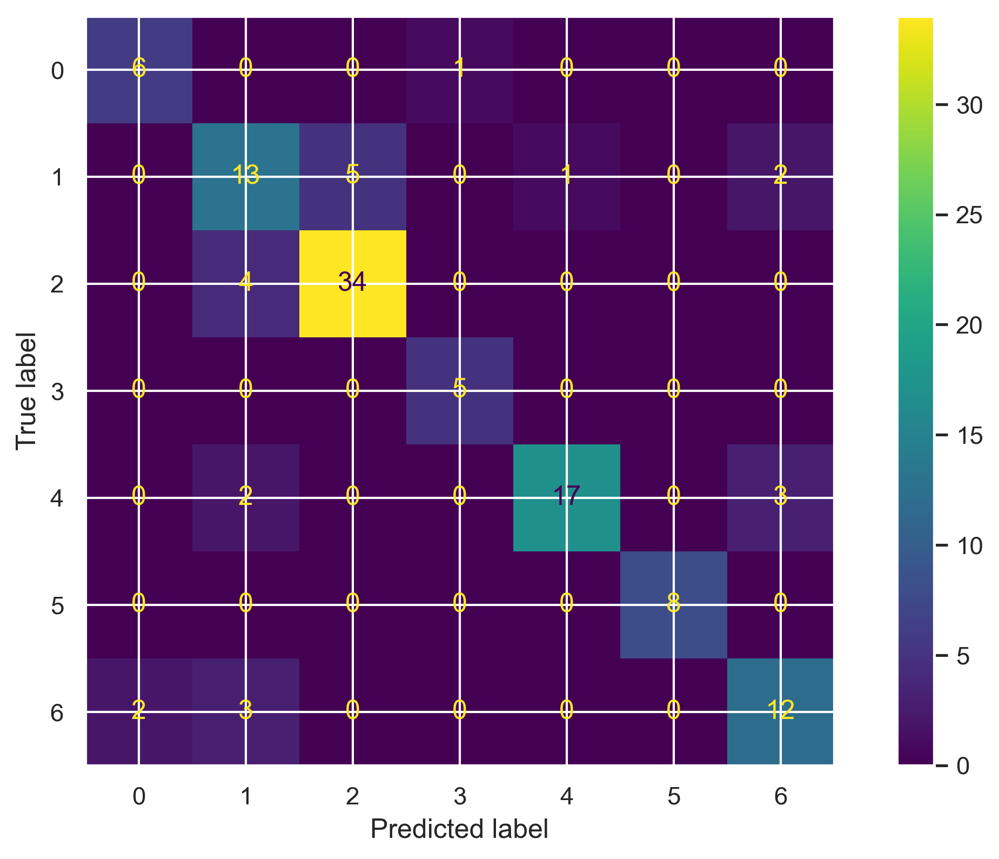

In [89]:
best_ccp_alpha_tree=ccp_alpha_grid_search.best_estimator_
ConfusionMatrixDisplay.from_predictions(y_test, best_ccp_alpha_tree.predict(X_test))
plt.show()

RANDOM FOREST - Hyperparameter Tuning with GridSearchCV
--------------------------

In [90]:
print(dt_model.get_depth())
print(dt_model.get_n_leaves())

12
54


In [91]:
from sklearn.ensemble import RandomForestClassifier
param_grid_dt = {'criterion': ['gini', 'entropy'], 'max_depth': [1,2,3,4,5,6,7,8,9,10]}
estimator_dt = RandomForestClassifier(random_state=42, n_estimators=200)
grid_dt = GridSearchCV(estimator_dt, param_grid_dt, refit=True, verbose=2)

In [92]:
grid_dt.fit(X_train,y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] END ........................criterion=gini, max_depth=1; total time=   0.1s
[CV] END ........................criterion=gini, max_depth=1; total time=   0.1s
[CV] END ........................criterion=gini, max_depth=1; total time=   0.1s
[CV] END ........................criterion=gini, max_depth=1; total time=   0.1s
[CV] END ........................criterion=gini, max_depth=1; total time=   0.1s
[CV] END ........................criterion=gini, max_depth=2; total time=   0.2s
[CV] END ........................criterion=gini, max_depth=2; total time=   0.2s
[CV] END ........................criterion=gini, max_depth=2; total time=   0.2s
[CV] END ........................criterion=gini, max_depth=2; total time=   0.2s
[CV] END ........................criterion=gini, max_depth=2; total time=   0.2s
[CV] END ........................criterion=gini, max_depth=3; total time=   0.2s
[CV] END ........................criterion=gini

GridSearchCV(estimator=RandomForestClassifier(n_estimators=200,
                                              random_state=42),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]},
             verbose=2)

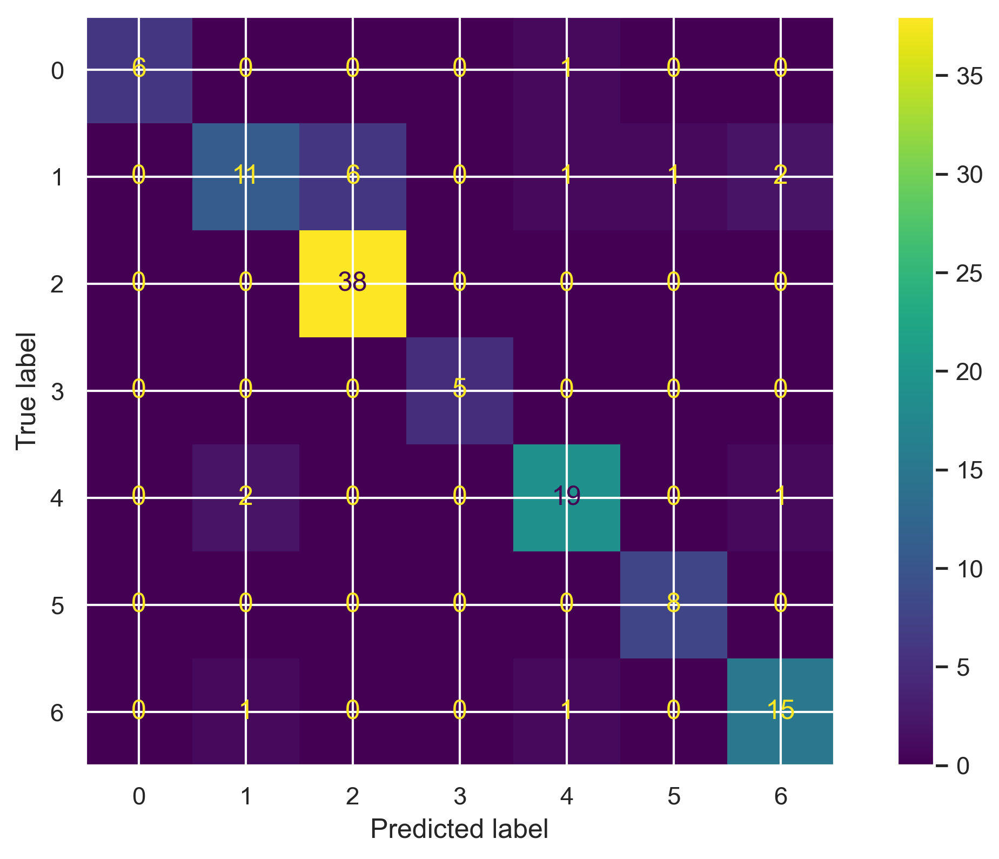

In [93]:
predictions = grid_dt.predict(X_test)
ConfusionMatrixDisplay.from_predictions(y_test, predictions)
plt.show()

In [94]:
print(classification_report(y_test,grid_dt.predict(X_test)))

              precision    recall  f1-score   support

           0       1.00      0.86      0.92         7
           1       0.79      0.52      0.63        21
           2       0.86      1.00      0.93        38
           3       1.00      1.00      1.00         5
           4       0.86      0.86      0.86        22
           5       0.89      1.00      0.94         8
           6       0.83      0.88      0.86        17

    accuracy                           0.86       118
   macro avg       0.89      0.88      0.88       118
weighted avg       0.86      0.86      0.86       118



In [95]:
df.columns

Index(['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY',
       'SOLIDITY', 'EXTENT', 'ASPECT_RATIO', 'ROUNDNESS', 'COMPACTNESS',
       'SHAPEFACTOR_1', 'SHAPEFACTOR_2', 'SHAPEFACTOR_4', 'MeanRR', 'MeanRG',
       'MeanRB', 'StdDevRR', 'StdDevRG', 'StdDevRB', 'SkewRR', 'SkewRG',
       'SkewRB', 'KurtosisRR', 'KurtosisRG', 'KurtosisRB', 'EntropyRR',
       'EntropyRG', 'EntropyRB', 'Class'],
      dtype='object')